### Imports

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys, os
import numpy as np
import torch
from torch import Tensor
from torch.utils.data import Dataset
from torchvision import transforms
import nibabel as nib
import nrrd
import random
from omegaconf import OmegaConf
from typing import Iterable, Dict, Callable, Tuple, Union
from scipy.ndimage import binary_erosion, binary_dilation
import random
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.patches import Patch


sys.path.append('..')
from dataset import EvalDataset
from utils import *
from model import get_model
from user_model import UserModel

/usr/local/lib/python3.10/dist-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Boiler plate

In [4]:
# Load config
cfg = OmegaConf.load('../configs/eval.yaml')

In [5]:
# Load dataset
dataset = EvalDataset(
    subject_id=784565,
    cfg=cfg, 
    modality='reconstruction',
    to_gpu=False
)

In [6]:
# Update Dataset with annotations
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
cached_annots = dataset.annotations.clone()

number of annotations: 1309.0


In [7]:
# Load model
model, state_dict = get_model(
    cfg=cfg,
    return_state_dict=True
)
model.load_state_dict(state_dict)

<All keys matched successfully>

In [8]:
# Extract features from model
f_layer = 'encoder'
# Init the feature extractor. Have a look at PyTorchs Hook functionality.
extractor = FeatureExtractor(model, layers=[f_layer])
# Cache all features for a dataset and reformat/move to numpy for random forest stuff
hooked_results  = extractor(dataset)
features = hooked_results[f_layer]
features = features.permute(0,2,3,1).numpy()

### Eval Definitions

In [12]:
### Uncertainty measures
def calc_binary_entropy(prob):
    eps = 1e-5
    
    #Edge Cases
    prob = torch.clamp(prob, eps, 1-eps)
    
    return -(prob*torch.log2(prob) + (1-prob)*torch.log2(1-prob))


def uncertainty_entropy(Y_predicted_prob, n_classes, test_mask):
    
    entropy = calc_binary_entropy(Y_predicted_prob)
    entropy_map = torch.zeros((145,145,145, n_classes))
    entropy_map[test_mask  == 1] = entropy.float()
    mean_entropy_map = entropy_map.mean(axis=-1)
    return mean_entropy_map, entropy_map


def uncertainty_sd(train_label, test_mask, n_classes):

    train_label_tensor = torch.from_numpy(train_label)
    annotated_voxels = torch.any(train_label_tensor, dim=-1)
    # per class
    sd_map_per_class = torch.zeros((n_classes, 145,145,145))
    for i in range(n_classes):
        train_label_i = train_label_tensor[:,:,:,i].bool()
        sd = torch.tensor(distance_transform_edt(~train_label_i))
        sd_map_per_class[i, test_mask == 1] = sd[test_mask == 1].float()  
    sd_map_per_class[:, annotated_voxels] = 0 # all values of annotated voxels should be 0
    # all classes
    spatial_distance_map, _ = torch.min(sd_map_per_class, dim=0)
    
    return spatial_distance_map, sd_map_per_class.permute(1,2,3,0)


def uncertainty_fd(train_label, features, test_mask, n_classes):
    
    train_label_tensor = torch.from_numpy(train_label)
    annotated_voxels = torch.any(train_label_tensor, dim=-1)
    brain_mask_tensor = torch.from_numpy(test_mask == 1)
    
    def compute_anomaly_scores(annotated_features, mask):
        iforest = IsolationForest(n_estimators=100, random_state=0, n_jobs=-1).fit(annotated_features)
        anomaly_scores = iforest.decision_function(features[mask].reshape(-1, 44))
        anomaly_scores = (anomaly_scores - anomaly_scores.min()) / (anomaly_scores.max() - anomaly_scores.min())
        return torch.from_numpy(1 - anomaly_scores).float()
    
    # all classes
    annotated_features = features[annotated_voxels].reshape(-1, 44)
    brain_na_mask = brain_mask_tensor & ~annotated_voxels
    anomaly_scores_map = torch.zeros((145,145,145))
    anomaly_scores_map[brain_na_mask] = compute_anomaly_scores(annotated_features, brain_na_mask)
    # anomaly_scores_map -= anomaly_scores_map.min()
    # anomaly_scores_map /= anomaly_scores_map.max()

    # per class
    fd_map_per_class = torch.zeros((n_classes, 145,145,145))
    # for i in range(n_classes):
    #     train_label_i = train_label_tensor[:,:,:,i].bool()
    #     annotated_features = features[train_label_i].reshape(-1, 44)
    #     brain_na_mask = brain_mask_tensor & ~train_label_i
    #     fd_map_per_class[i, brain_na_mask == 1] = compute_anomaly_scores(annotated_features, brain_na_mask)
    # fd_map_per_class[:, annotated_voxels] = 0 # all values of annotated voxels should be 0
    # fd_map_per_class -= fd_map_per_class.amin(dim=(1,2,3), keepdim=True)
    # fd_map_per_class /= fd_map_per_class.amax(dim=(1,2,3), keepdim=True)

    return anomaly_scores_map, fd_map_per_class.permute(1,2,3,0)


def evaluate_RF(
    dataset: Dataset, 
    features: Tensor, 
    cfg: Dict[str, str], 
    uncertainty_measures: List[str], 
    tta=False
)-> Union[Dict[str, float], Tensor]:

                ###############################
                ##### TRAIN RANDOM FOREST #####
                ###############################
                
    train_mask  = dataset.weight.detach().cpu().squeeze().numpy()    #.permute(0,2,3,1).repeat(1,1,1,44).numpy()
    test_mask   = dataset.brain_mask.detach().cpu().numpy()#.unsqueeze(3).repeat(1,1,1,44).numpy()
    train_label = dataset.annotations.detach().cpu().permute(1,2,3,0).numpy()
    test_label  = dataset.label.detach().cpu().permute(1,2,3,0).numpy()
    
    if tta:
        f = np.stack(features, axis=0)  # (n_tta, 145, 145, 145, 44)
        train_m = np.repeat(train_mask[np.newaxis, ...], len(features), axis=0)  # (n_tta, 145, 145, 145)
        test_m = np.repeat(test_mask[np.newaxis, ...], len(features), axis=0)  # (n_tta, 145, 145, 145)
        train_l = np.repeat(train_label[np.newaxis, ...], len(features), axis=0)  # (n_tta, 145, 145, 145, 5)

        X_train = f.reshape((-1, f.shape[-1]))[train_m.reshape(-1) == 1]    # (n_tta*train_voxels, 44)
        X_test = f.reshape((-1, f.shape[-1]))[test_m.reshape(-1) == 1]    # (n_tta*844350, 44)
        Y_train = train_l.reshape((-1, train_l.shape[-1]))[train_m.reshape(-1) == 1]   # (n_tta*train_voxels, 5)
    
    else:
        # Input - Mask voxels that are not labelled before flattening the input
        X_train = features.reshape((-1, features.shape[-1]))[train_mask.reshape(-1) == 1]
        X_test  = features.reshape((-1, features.shape[-1]))[test_mask.reshape(-1)  == 1]
        # Target - Same as above. Mask before flattening
        Y_train = train_label.reshape((-1, train_label.shape[-1]))[train_mask.reshape(-1) == 1]

    Y_test  = test_label.reshape((-1,  train_label.shape[-1]))[test_mask.reshape(-1)  == 1]

    # Init Random Forest Classifier
    clf = RandomForestClassifier(n_estimators=100,
                         bootstrap=True,
                         oob_score=True,
                         random_state=0,
                         n_jobs=-1,
                         max_features="sqrt", # changed from "auto" because auto got removed
                         class_weight="balanced",
                         max_depth=None,
                         min_samples_leaf=cfg["min_samples_leaf"])

    # Train
    clf.fit(X_train, Y_train)
    # predict labels in test mask
    predicted_prob    = clf.predict_proba(X_test)
    Y_predicted_prob  = torch.tensor(np.array([p[:, 1] for p in predicted_prob])).T
    if tta:
        Y_predicted_prob = Y_predicted_prob.reshape((len(features), 844350, 5)).mean(axis=0)
    Y_predicted_label = (Y_predicted_prob > 0.5)*1


                ###############################
                ####### Save Prediction #######
                ###############################
                
    n_classes = len(cfg['data']['labels'])
    prediction = torch.zeros((145,145,145, n_classes))
    prediction.view(-1, n_classes)[test_mask.reshape(-1)  == 1] = Y_predicted_label.float()

                ###############################
                ##### Evaluate Prediction #####
                ###############################

    # Constant for numerical stability
    eps = 1e-5
    # statictics for precision, recall and Dice (f1)
    TP       = (Y_predicted_label * Y_test).sum(axis=0)
    TPplusFP = Y_predicted_label.sum(axis=0)
    TPplusFN = Y_test.sum(axis=0)

    precision = (TP + eps) / (TPplusFP + eps)
    recall    = (TP + eps) / (TPplusFN + eps)
    f1        = (2 * precision * recall + eps) / ( precision + recall  + eps)

    uncertainty_maps = {}
    uncertainty_per_class_maps = {}

    for measure in uncertainty_measures:
        match measure:
            case 'ground-truth':
                continue
            case 'random':
                break
            case 'entropy':
                uncertainty_map, uncertainty_per_class = uncertainty_entropy(Y_predicted_prob, n_classes, test_mask)
            case 'spatial-distance':
                uncertainty_map, uncertainty_per_class = uncertainty_sd(train_label, test_mask, n_classes)
            case 'feature-distance':
                uncertainty_map, uncertainty_per_class = uncertainty_fd(train_label, features, test_mask, n_classes)
            case _:
                raise ValueError(f"Uncertainty measure {measure} not implemented")

        uncertainty_maps[measure] = uncertainty_map
        uncertainty_per_class_maps[measure] = uncertainty_per_class.permute(3,0,1,2)

    #TODO: for measure in novelty_scores:

    labels = cfg['data']["labels"]
    scores = {}
    for c in range(len(labels)):
        scores[f"{labels[c]}_precision"] = precision[c].numpy()
        scores[f"{labels[c]}_recall"] = recall[c].numpy()
        scores[f"{labels[c]}_f1"] = f1[c].numpy()

    scores["Avg_prec_tracts"] = precision[1:].mean().numpy()
    scores["Avg_recall_tracts"] = recall[1:].mean().numpy()
    scores["Avg_f1_tracts"] = f1[1:].mean().numpy()
    
    
    return scores, prediction.permute(3,0,1,2), uncertainty_maps, uncertainty_per_class_maps

### Experiments

In [10]:
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.patches import Patch

def format_e(n):
    a = '%e' % n
    return a.split('e')[0].rstrip('0').rstrip('.') + 'e' + a.split('e')[1]


# Create a custom colormap - transparent for class 0, and different colors for other classes
seg_colors = ['none', 'yellow', 'green', 'blue']  # 'none' for transparent
err_colors = ['none', 'black']
seg_cmap = ListedColormap(seg_colors)
err_cmap = ListedColormap(err_colors)

# Ensure the colormap is normalized to the number of classes
seg_norm = Normalize(vmin=0, vmax=len(seg_colors)-1)
err_norm = Normalize(vmin=0, vmax=len(err_colors)-1)


def plot_slices(
    maps, 
    errmaps, 
    annots, 
    title
):
    num_rows = len(maps)
    num_cols = 2

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    legend_elements = [
        Patch(facecolor='red', edgecolor='red', label='correct'),
        Patch(facecolor='blue', edgecolor='blue', label='mis-classified'),
    ]

    for i, (map, errmap, annot) in enumerate(zip(maps, errmaps, annots)):
        map_diverge = map.clone()
        map_diverge[errmap == 0] *= -1

        map_annotated = map.clone()
        print(map_annotated.sum(), map_diverge.sum())

        img1 = axes[i, 0].imshow(map_diverge, vmin=-1, vmax=1, cmap='Spectral')
        axes[i, 0].set_title(f'{title} - Refinement {i+1} - Error Indication')
        axes[i, 0].axis('off')
        axes[i, 0].legend(handles=legend_elements, loc='upper right', ncol=2)
        fig.colorbar(img1, ax=axes[i, 0])


        img2 = axes[i, 1].imshow(map_annotated, vmin=0,  vmax=1, cmap='YlOrBr')
        axes[i, 1].imshow(annot, cmap=err_cmap, norm=err_norm)
        axes[i, 1].set_title(f'{title} - Refinement {i+1} - Annotations')
        axes[i, 1].axis('off')
        fig.colorbar(img2, ax=axes[i, 1])


    plt.tight_layout(rect=[0, 0, 1, 0.97])
    return fig, axes


In [196]:
# umap from evaluate_RF
# errmap from evaluate_RF -> prediction + dataset.label
# annot from refinement_annotation
## PARAMS
num_iterations = 5

## VARS
# maps = []
# errmaps = []
# annots = []

# Fresh dataset
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
cached_annots = dataset.annotations.clone()
gt = dataset.label.detach().cpu()
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)

for i in range(num_iterations):
    scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
        dataset, 
        features, 
        cfg,
        uncertainty_measures=[
            # 'ground-truth',
            'entropy',
            # 'feature-distance',
        ]
    )
    errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)
    print(scores)

    u_annots, selection = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=uncertainty_per_class_maps['entropy'],
        n_samples=240,
        mode='per_class',
        map_type='per_class', 
        seed=42,
        inverse_class_freq=False
    )
    dataset.update_annotation(u_annots)

    # nmap = uncertainty_maps['feature-distance'].clone()
    # mask = prediction[1:].any(0)
    # nmap *= mask

    # n_annots, selection = dataset.user.refinement_annotation(
    #     prediction=prediction,
    #     #self.label.detach().cpu(),
    #     annotation_mask=dataset.annotations.detach().cpu(),
    #     uncertainty_map=nmap,
    #     n_samples=200,
    #     mode='single_slice',
    #     map_type='per_slice', 
    #     seed=42,
    #     inverse_class_freq=False
    # )
    # dataset.update_annotation(n_annots)

    # # collect
    # maps.append(nmap[selection[1:]])
    # errmaps.append(errmap[selection[1:]])
    # annots.append(n_annots.any(0)[selection[1:]])

scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        # 'feature-distance',
    ]
)
errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)
print(scores)

number of annotations: 1309.0
{'Other_precision': array(0.92834663, dtype=float32), 'Other_recall': array(0.43598189), 'Other_f1': array(0.59332389), 'CG_precision': array(0.2743255, dtype=float32), 'CG_recall': array(0.63447333), 'CG_f1': array(0.38304471), 'CST_precision': array(0.44778952, dtype=float32), 'CST_recall': array(0.52491298), 'CST_f1': array(0.48329909), 'FX_precision': array(0.05466991, dtype=float32), 'FX_recall': array(0.41236413), 'FX_f1': array(0.0965601), 'CC_precision': array(0.4051588, dtype=float32), 'CC_recall': array(0.74481508), 'CC_f1': array(0.52483062), 'Avg_prec_tracts': array(0.29548594, dtype=float32), 'Avg_recall_tracts': array(0.57914138), 'Avg_f1_tracts': array(0.37193363)}
{'Other_precision': array(0.9516415, dtype=float32), 'Other_recall': array(0.5728123), 'Other_f1': array(0.71515894), 'CG_precision': array(0.41785535, dtype=float32), 'CG_recall': array(0.75638905), 'CG_f1': array(0.53832664), 'CST_precision': array(0.43954062, dtype=float32), 'C

{'Other_precision': array(0.92834663, dtype=float32), 'Other_recall': array(0.43598189), 'Other_f1': array(0.59332389), 'CG_precision': array(0.2743255, dtype=float32), 'CG_recall': array(0.63447333), 'CG_f1': array(0.38304471), 'CST_precision': array(0.44778952, dtype=float32), 'CST_recall': array(0.52491298), 'CST_f1': array(0.48329909), 'FX_precision': array(0.05466991, dtype=float32), 'FX_recall': array(0.41236413), 'FX_f1': array(0.0965601), 'CC_precision': array(0.4051588, dtype=float32), 'CC_recall': array(0.74481508), 'CC_f1': array(0.52483062), 'Avg_prec_tracts': array(0.29548594, dtype=float32), 'Avg_recall_tracts': array(0.57914138), 'Avg_f1_tracts': array(0.37193363)}
{'Other_precision': array(0.9574399, dtype=float32), 'Other_recall': array(0.58806763), 'Other_f1': array(0.72861602), 'CG_precision': array(0.4390119, dtype=float32), 'CG_recall': array(0.73672025), 'CG_f1': array(0.55017838), 'CST_precision': array(0.5014742, dtype=float32), 'CST_recall': array(0.58105582), 'CST_f1': array(0.53834408), 'FX_precision': array(0.0941333, dtype=float32), 'FX_recall': array(0.43274456), 'FX_f1': array(0.15464646), 'CC_precision': array(0.6102079, dtype=float32), 'CC_recall': array(0.79172528), 'CC_f1': array(0.6892177), 'Avg_prec_tracts': array(0.4112068, dtype=float32), 'Avg_recall_tracts': array(0.63556148), 'Avg_f1_tracts': array(0.48309665)}
{'Other_precision': array(0.9530738, dtype=float32), 'Other_recall': array(0.71691409), 'Other_f1': array(0.81829689), 'CG_precision': array(0.47050494, dtype=float32), 'CG_recall': array(0.75466914), 'CG_f1': array(0.57963626), 'CST_precision': array(0.57822484, dtype=float32), 'CST_recall': array(0.60951399), 'CST_f1': array(0.5934607), 'FX_precision': array(0.11029412, dtype=float32), 'FX_recall': array(0.40760869), 'FX_f1': array(0.17362707), 'CC_precision': array(0.62455386, dtype=float32), 'CC_recall': array(0.82450054), 'CC_f1': array(0.71073445), 'Avg_prec_tracts': array(0.44589442, dtype=float32), 'Avg_recall_tracts': array(0.64907309), 'Avg_f1_tracts': array(0.51436462)}
{'Other_precision': array(0.9513961, dtype=float32), 'Other_recall': array(0.76116047), 'Other_f1': array(0.84571324), 'CG_precision': array(0.5136937, dtype=float32), 'CG_recall': array(0.73742586), 'CG_f1': array(0.60555841), 'CST_precision': array(0.5632226, dtype=float32), 'CST_recall': array(0.64528813), 'CST_f1': array(0.60147227), 'FX_precision': array(0.14942528, dtype=float32), 'FX_recall': array(0.45923913), 'FX_f1': array(0.22549638), 'CC_precision': array(0.68256915, dtype=float32), 'CC_recall': array(0.81665309), 'CC_f1': array(0.74361689), 'Avg_prec_tracts': array(0.47722766, dtype=float32), 'Avg_recall_tracts': array(0.66465155), 'Avg_f1_tracts': array(0.54403599)}
{'Other_precision': array(0.9532388, dtype=float32), 'Other_recall': array(0.7722525), 'Other_f1': array(0.85325469), 'CG_precision': array(0.516661, dtype=float32), 'CG_recall': array(0.69916871), 'CG_f1': array(0.5942201), 'CST_precision': array(0.5027689, dtype=float32), 'CST_recall': array(0.71980147), 'CST_f1': array(0.59202453), 'FX_precision': array(0.19944367, dtype=float32), 'FX_recall': array(0.48709239), 'FX_f1': array(0.28301814), 'CC_precision': array(0.71395904, dtype=float32), 'CC_recall': array(0.81566952), 'CC_f1': array(0.76143429), 'Avg_prec_tracts': array(0.48320818, dtype=float32), 'Avg_recall_tracts': array(0.68043302), 'Avg_f1_tracts': array(0.55767426)}
{'Other_precision': array(0.9506348, dtype=float32), 'Other_recall': array(0.78249424), 'Other_f1': array(0.8584092), 'CG_precision': array(0.527668, dtype=float32), 'CG_recall': array(0.68609292), 'CG_f1': array(0.59654466), 'CST_precision': array(0.48029333, dtype=float32), 'CST_recall': array(0.75564007), 'CST_f1': array(0.58729856), 'FX_precision': array(0.25738832, dtype=float32), 'FX_recall': array(0.50883152), 'FX_f1': array(0.34186163), 'CC_precision': array(0.7048952, dtype=float32), 'CC_recall': array(0.81362305), 'CC_f1': array(0.75536821), 'Avg_prec_tracts': array(0.49256122, dtype=float32), 'Avg_recall_tracts': array(0.69104689), 'Avg_f1_tracts': array(0.57026826)}

In [13]:
# umap from evaluate_RF
# errmap from evaluate_RF -> prediction + dataset.label
# annot from refinement_annotation
## PARAMS
num_iterations = 5

## VARS
maps = []
errmaps = []
annots = []
results = []

preds = {
    'before': [],
    'after': []
}

# Fresh dataset
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
cached_annots = dataset.annotations.clone()
gt = dataset.label.detach().cpu()
# dataset.user = UserModel(dataset.label, 'estimated', cfg)

for i in range(num_iterations):
    scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
        dataset, 
        features, 
        cfg,
        uncertainty_measures=[
            # 'ground-truth',
            'entropy',
            # 'feature-distance',
        ]
    )
    if i > 0:
        preds['after'].append(prediction.clone())
    results.append(scores)
    print(f'Scores after: {scores}')

    # umaps = uncertainty_per_class_maps['entropy'].clone()
    # mask = prediction[1:].any(0, keepdim=True)
    # umaps *= mask
    # dataset.user = UserModel(dataset.label, 'estimated', cfg)
    u_annots, selection = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=uncertainty_per_class_maps['entropy'],
        n_samples=200,
        mode='per_class',
        map_type='per_class', 
        seed=42,
        inverse_class_freq=False
    )


    dataset.update_annotation(u_annots)
    print(f"number of uncertainty annotations: {u_annots.sum()}")

    scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
        dataset, 
        features, 
        cfg,
        uncertainty_measures=[
            # 'ground-truth',
            # 'entropy',
            'feature-distance',
        ]
    )
    print(f'Scores before: {scores}')
    preds['before'].append(prediction.clone())

    nmap = uncertainty_maps['feature-distance'].clone()
    mask = prediction[1:].any(0)
    nmap *= mask
    dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
    n_annots, selection = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=nmap,
        n_samples=200,
        mode='single_slice',
        map_type='per_slice', 
        seed=42,
        inverse_class_freq=False
    )    


    # nmap = uncertainty_per_class_maps['feature-distance'].clone()
    # nmap = uncertainty_maps['feature-distance'].clone().repeat(5, 1, 1, 1)
    # nmap *= prediction

    # n_annots, selection = dataset.user.refinement_annotation(
    #     prediction=prediction,
    #     #self.label.detach().cpu(),
    #     annotation_mask=dataset.annotations.detach().cpu(),
    #     uncertainty_map=nmap,
    #     n_samples=40,
    #     mode='per_class',
    #     map_type='per_class',
    #     seed=42,
    #     inverse_class_freq=False
    # )
    dataset.update_annotation(n_annots)
    print(f"number of novelty annotations: {n_annots.sum()}")
    print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
    # collect
    errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)
    maps.append(nmap[selection[1:]])
    annots.append(n_annots.any(0)[selection[1:]])
    errmaps.append(errmap[selection[1:]])

scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        'feature-distance',
    ]
)
preds['after'].append(prediction.clone())
errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)
print(f'Scores after: {scores}')
results.append(scores)

number of annotations: 1309.0
Scores after: {'Other_precision': array(0.94462985, dtype=float32), 'Other_recall': array(0.51948189), 'Other_f1': array(0.67033101), 'CG_precision': array(0.30621332, dtype=float32), 'CG_recall': array(0.71570638), 'CG_f1': array(0.42892153), 'CST_precision': array(0.41224927, dtype=float32), 'CST_recall': array(0.65643934), 'CST_f1': array(0.50645081), 'FX_precision': array(0.07059982, dtype=float32), 'FX_recall': array(0.43817934), 'FX_f1': array(0.1216236), 'CC_precision': array(0.4172556, dtype=float32), 'CC_recall': array(0.78051463), 'CC_f1': array(0.54380444), 'Avg_prec_tracts': array(0.3015795, dtype=float32), 'Avg_recall_tracts': array(0.64770993), 'Avg_f1_tracts': array(0.4002001)}
number of uncertainty annotations: 1140.0
Scores before: {'Other_precision': array(0.9521725, dtype=float32), 'Other_recall': array(0.67675736), 'Other_f1': array(0.79118299), 'CG_precision': array(0.49079108, dtype=float32), 'CG_recall': array(0.77208882), 'CG_f1': a

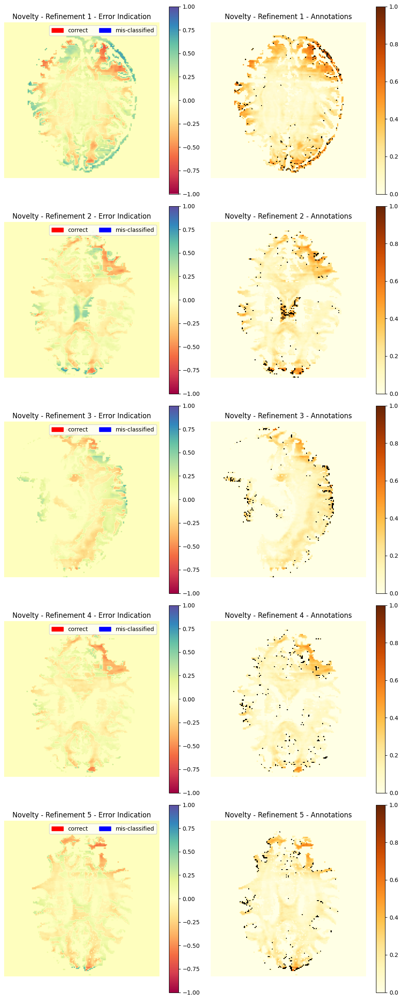

In [198]:
fig, axes = plot_slices(
    maps=maps, 
    errmaps=errmaps,
    annots=annots, 
    title='Novelty'
)

# fig.savefig('../../results/novelty_annotations_foreground-only.png')

In [210]:
# umap from evaluate_RF
# errmap from evaluate_RF -> prediction + dataset.label
# annot from refinement_annotation
## PARAMS
num_iterations = 1

## VARS
maps = []
errmaps = []
annots = []
results = []

preds = {
    'before': [],
    'after': []
}

# Fresh dataset
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
cached_annots = dataset.annotations.clone()
gt = dataset.label.detach().cpu()
# dataset.user = UserModel(dataset.label, 'estimated', cfg)

for i in range(num_iterations):
    scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
        dataset, 
        features, 
        cfg,
        uncertainty_measures=[
            # 'ground-truth',
            'entropy',
            'feature-distance',
        ]
    )

    # if i > 0:
    #     preds['after'].append(prediction.clone())
    # results.append(scores)
    # print(f'Scores after: {scores}')
    # # dataset.user = UserModel(dataset.label, 'estimated', cfg)
    # u_annots, selection = dataset.user.refinement_annotation(
    #     prediction=prediction,
    #     #self.label.detach().cpu(),
    #     annotation_mask=dataset.annotations.detach().cpu(),
    #     uncertainty_map=uncertainty_per_class_maps['entropy'],
    #     n_samples=200,
    #     mode='per_class',
    #     map_type='per_class', 
    #     seed=42,
    #     inverse_class_freq=False
    # )


    # dataset.update_annotation(u_annots)
    # print(f"number of uncertainty annotations: {u_annots.sum()}")

    # scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    #     dataset, 
    #     features, 
    #     cfg,
    #     uncertainty_measures=[
    #         # 'ground-truth',
    #         # 'entropy',
    #         'feature-distance',
    #     ]
    # )

number of annotations: 1309.0


In [233]:
pred = prediction.clone().flatten(1).T
gt = dataset.label.clone().flatten(1).T
nmap = uncertainty_maps['feature-distance'].clone().reshape(-1)

In [232]:
pred.shape

torch.Size([3048625, 5])

In [249]:
part = 10
threshold = nmap.shape[0] // part

values, indices = nmap.sort(descending=True)
selection = indices[:threshold]

In [250]:
pred_tmp = pred.clone()
pred_tmp[selection] = torch.tensor([1, 0, 0, 0, 0]).float()

In [252]:
f1(pred_tmp, gt)[1:].mean()

tensor(0.3968)

In [237]:

def f1(pred, gt):
    # Constant for numerical stability
    eps = 1e-5
    # statictics for precision, recall and Dice (f1)
    TP       = (pred * gt).sum(axis=0)
    TPplusFP = pred.sum(axis=0)
    TPplusFN = gt.sum(axis=0)

    precision = (TP + eps) / (TPplusFP + eps)
    recall    = (TP + eps) / (TPplusFN + eps)
    f1        = (2 * precision * recall + eps) / ( precision + recall  + eps)

    return f1

In [254]:
torch.tensor([0.5933, 0.3830, 0.4827, 0.0966, 0.5248])[1:].mean()

tensor(0.3718)

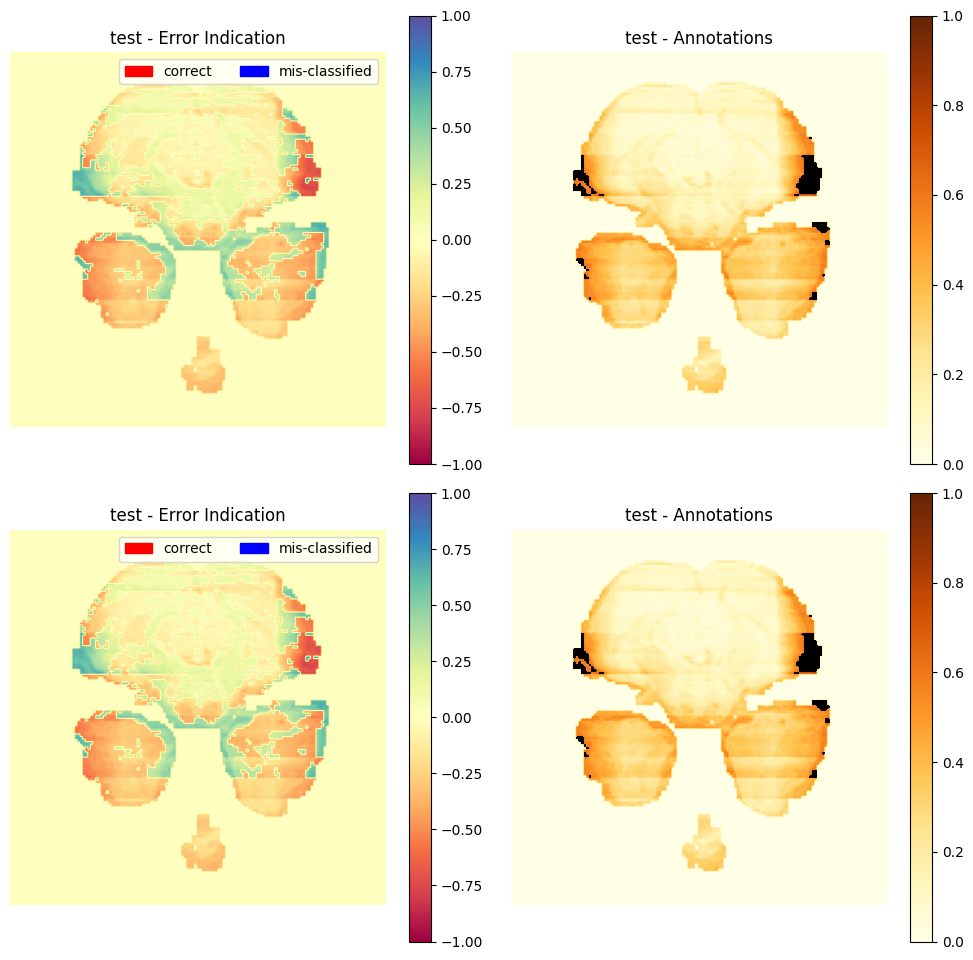

In [152]:
fig, axes = plot_slices(
    maps=torch.stack([
        uncertainty_maps['feature-distance'][selection[1:]],
        uncertainty_maps['feature-distance'][selection[1:]]
    ], dim=0), 
    errmaps=[
        errmap[selection[1:]], 
        errmap[selection[1:]]
    ],
    annots=[
        n_annots.any(0)[selection[1:]],
        n_annots.any(0)[selection[1:]]
    ], 
    title='test'
)

In [139]:
n_annots.any(0)[selection[1:]].shape

torch.Size([145, 145])

In [36]:
scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        'feature-distance',
    ]
)


nmap = uncertainty_maps['feature-distance']
umap = uncertainty_maps['entropy']
gt = dataset.label.detach().cpu()
errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)
annot = dataset.annotations.clone()

In [114]:
dataset.user = UserModel(dataset.label, 'estimated', cfg)
dataset.annotations = cached_annots.clone()
n_annots = dataset.user.refinement_annotation(
    prediction=prediction,
    #self.label.detach().cpu(),
    annotation_mask=dataset.annotations.detach().cpu(),
    uncertainty_map=uncertainty_maps['feature-distance'],
    n_samples=200,
    mode='single_slice',
    map_type='per_slice', # or 'single
    seed=42,
    inverse_class_freq=False
)
dataset.update_annotation(n_annots)


scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        'feature-distance',
    ]
)

tensor(0.)
tensor(200.)


In [127]:
n_annots, selection = dataset.user.refinement_annotation(
    prediction=prediction,
    #self.label.detach().cpu(),
    annotation_mask=dataset.annotations.detach().cpu(),
    uncertainty_map=uncertainty_maps['feature-distance'],
    n_samples=200,
    mode='single_slice',
    map_type='per_slice', # or 'single
    seed=42,
    inverse_class_freq=False
)
dataset.update_annotation(n_annots)


tensor(0.)
tensor(200.)


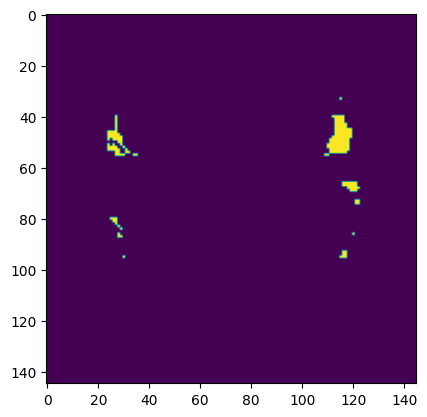

In [132]:
plt.imshow(n_annots.any(0)[selection[1:]])

In [ ]:
selection[1:]

In [117]:
for i in range(3):
    print(i, (i+1)%3)
    print(n_annots.any(0).sum((i, (i+1)%3)))
    print(n_annots.any(0).sum((i, (i+1)%3)).argmax())

0 1
tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  3,
         5,  7,  8,  9, 12, 16, 15, 15, 12, 13, 14, 11, 12,  8,  7,  0,  0,  0,
         5,  4,  5,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  1,  1,  1,  0,
         2,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  3,  2,  3,  2,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0])
tensor(23)
1 2
tensor([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0, 200,
          0,   0

In [125]:
map_by_error = uncertainty_maps['feature-distance'][55, :, :].clone()
err_slice = errmap[55, :, :].clone()
map_by_error[err_slice == 0] *= -1

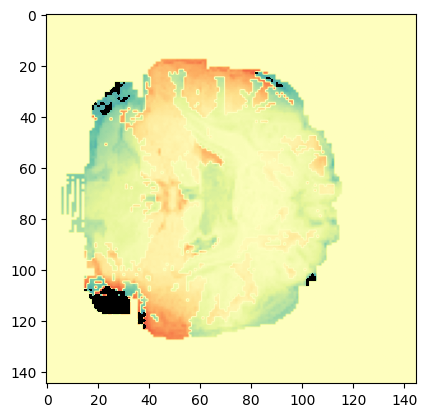

In [126]:
plt.imshow(map_by_error, vmin=-1, vmax=1, cmap='Spectral')
plt.imshow(n_annots.any(0)[55, :, :], cmap=err_cmap, norm=err_norm)

In [108]:
for i in range(3):
    print(i, (i+1)%3)
    print(n_annots.any(0).sum((i, (i+1)%3)))
    print(n_annots.any(0).sum((i, (i+1)%3)).argmax())

0 1
tensor([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0, 200,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0])
tensor(71)
1 2
tensor([ 0,  0,  0,  0,  0,  0,  1,  9,  0,  0, 10, 11,  8,  1,  0,  0,  0,  2,
         4,  6,  4,  6,  7,  7,  4,  2,  3,  2,  2,  2,  0,  0,  4,  3,  2,  2,
       

In [111]:
map_by_error = uncertainty_maps['feature-distance'][:, :, 71].clone()
err_slice = errmap[:, :, 71].clone()
map_by_error[err_slice == 0] *= -1

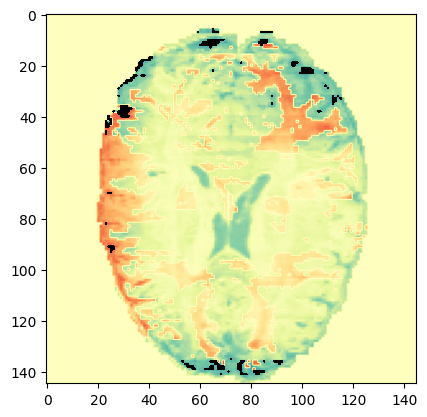

In [112]:
plt.imshow(map_by_error, vmin=-1, vmax=1, cmap='Spectral')
plt.imshow(n_annots.any(0)[:, :, 71], cmap=err_cmap, norm=err_norm)

tensor(5)
tensor(5)
tensor(5)
tensor(5)
tensor(4)


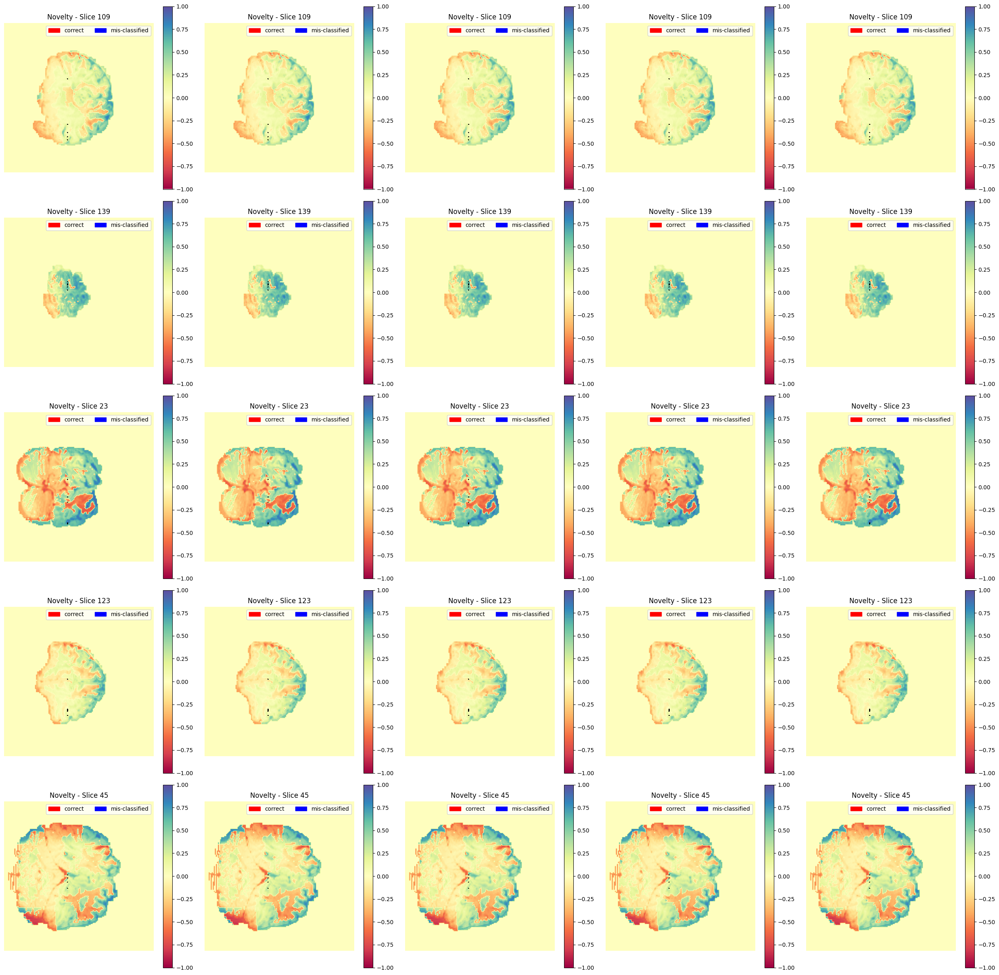

In [95]:
fig, axes = plot_slices(
    maps=[nmap] * 5, 
    errmap=errmap, 
    annot=n_annots, 
    slices=n_annots.any(0).sum((1,2)).sort(descending=True).indices[:5], 
    titles=['Novelty'] * 5
)

In [12]:
scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        'feature-distance',
    ]
)

print(scores)

{'Other_precision': array(0.92834663, dtype=float32), 'Other_recall': array(0.43598189), 'Other_f1': array(0.59332389), 'CG_precision': array(0.2743255, dtype=float32), 'CG_recall': array(0.63447333), 'CG_f1': array(0.38304471), 'CST_precision': array(0.44778952, dtype=float32), 'CST_recall': array(0.52491298), 'CST_f1': array(0.48329909), 'FX_precision': array(0.05466991, dtype=float32), 'FX_recall': array(0.41236413), 'FX_f1': array(0.0965601), 'CC_precision': array(0.4051588, dtype=float32), 'CC_recall': array(0.74481508), 'CC_f1': array(0.52483062), 'Avg_prec_tracts': array(0.29548594, dtype=float32), 'Avg_recall_tracts': array(0.57914138), 'Avg_f1_tracts': array(0.37193363)}


In [13]:
nmap = uncertainty_maps['feature-distance']
umap = uncertainty_maps['entropy']
gt = dataset.label.detach().cpu()
errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)

In [34]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

def plot_slices(map_data1, map_data2, errmap, num_slices=10, title1='Map1', title2='Map2'):
    slices = torch.linspace(10, map_data1.shape[0] - 10, num_slices).long()
    fig, axes = plt.subplots(num_slices, 3, figsize=(15, 5 * num_slices))

    vmax1 = 1 # map_data1.max().item()
    vmin1 = -vmax1
    vmax2 = 1 # map_data2.max().item()
    vmin2 = -vmax2


    legend_elements = [
        Patch(facecolor='red', edgecolor='red', label='correct'),
        Patch(facecolor='blue', edgecolor='blue', label='missclassified'),
    ]


    for i, slice_idx in enumerate(slices):
        map_slice1 = map_data1[slice_idx].detach().cpu()
        map_slice2 = map_data2[slice_idx].detach().cpu()
        err_slice = errmap[slice_idx].detach().cpu()

        # Map1 where errmap is 1
        masked_map1_err1 = map_slice1.clone()
        masked_map1_err1[err_slice == 0] *= -1
        im1 = axes[i, 0].imshow(masked_map1_err1, vmin=vmin1, vmax=vmax1, cmap='Spectral')
        axes[i, 0].set_title(f'{title1} - Idx {slice_idx}')
        axes[i, 0].axis('off')
        axes[i, 0].legend(handles=legend_elements, loc='upper right', ncol=2)
        fig.colorbar(im1, ax=axes[i, 0])

        # Map2 where errmap is 1
        masked_map2_err1 = map_slice2.clone()
        masked_map2_err1[err_slice == 0] *= -1
        im2 = axes[i, 1].imshow(masked_map2_err1, vmin=vmin2, vmax=vmax2, cmap='Spectral')
        axes[i, 1].set_title(f'{title2} - Idx {slice_idx}')
        axes[i, 1].axis('off')
        axes[i, 1].legend(handles=legend_elements, loc='upper right', ncol=2)
        fig.colorbar(im2, ax=axes[i, 1])

        im3 = axes[i, 2].imshow(map_slice2, vmin=0, vmax=vmax2, cmap='YlOrBr')
        axes[i, 2].set_title(f'{title2} - Idx {slice_idx}')
        axes[i, 2].axis('off')
        fig.colorbar(im3, ax=axes[i, 2])

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    return fig, axes

# Example data (replace with actual data)
# nmap = torch.rand(145, 145, 145)
# umap = torch.rand(145, 145, 145)
# gt = torch.randint(0, 2, (145, 145, 145))
# errmap = (torch.randint(0, 2, (145, 145, 145)) != gt) * torch.randint(0, 2, (145, 145, 145))



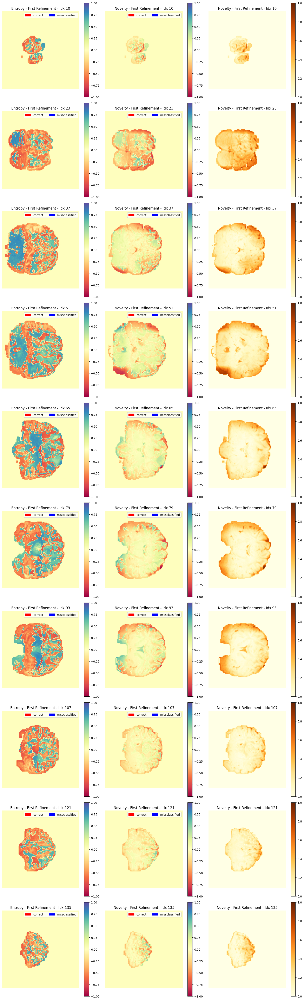

In [36]:
fig, axes = plot_slices(umap, nmap, errmap, num_slices=10, title1='Entropy - First Refinement', title2='Novelty - First Refinement')
plt.show()
fig.savefig('../../results/uncertainty-vs-novelty_first-refinement.png')

In [41]:
# # Make a prediction with the random forest
results = []
num_iter = 1

# Update Dataset with annotations
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
dataset.user = UserModel(dataset.label, 'estimated', cfg)

for it in range(num_iter):

    scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
        dataset, 
        features, 
        cfg,
        uncertainty_measures=[
            'ground-truth',
            'entropy',
            'feature-distance',
        ]
    )

    results.append(
        {
            'scores': scores,
            'prediction': prediction.clone(),
            'uncertainty_maps': uncertainty_maps
        }
    )


    u_annots = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=uncertainty_per_class_maps['entropy'],
        n_samples=200,
        mode='per_class',
        seed=42,
        inverse_class_freq=False
    )
    dataset.update_annotation(u_annots)
    n_annots = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=uncertainty_maps['feature-distance'],
        n_samples=200,
        mode='single_slice',
        seed=42,
        inverse_class_freq=False
    )
    dataset.update_annotation(n_annots)
    print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")


scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        'feature-distance',
    ]
)

results.append(
    {
        'scores': scores,
        'prediction': prediction.clone(),
        'uncertainty_maps': uncertainty_maps
    }
)

number of annotations: 1309.0
number of annotations: 2472.0


In [42]:
nmap = uncertainty_maps['feature-distance']
umap = uncertainty_maps['entropy']
gt = dataset.label.detach().cpu()
errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)

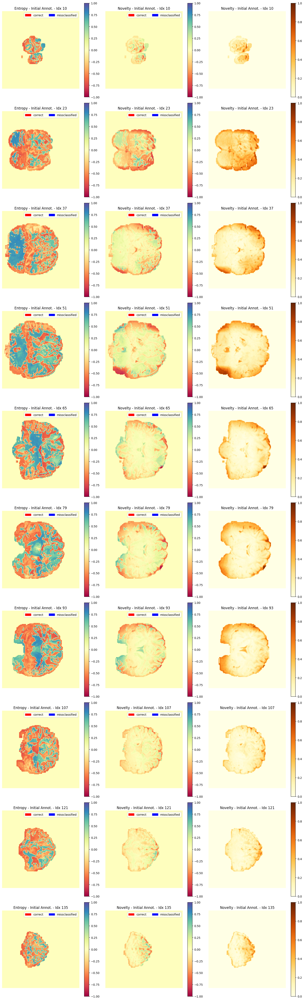

In [43]:
fig, axes = plot_slices(umap, nmap, errmap, num_slices=10, title1='Entropy - Initial Annot.', title2='Novelty - Initial Annot.')
plt.show()
fig.savefig('../../results/uncertainty-vs-novelty_first-refinement.png')

In [44]:
# # Make a prediction with the random forest
results = []
num_iter = 5

# Update Dataset with annotations
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
dataset.user = UserModel(dataset.label, 'estimated', cfg)

for it in range(num_iter):

    scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
        dataset, 
        features, 
        cfg,
        uncertainty_measures=[
            'ground-truth',
            'entropy',
            'feature-distance',
        ]
    )

    results.append(
        {
            'scores': scores,
            'prediction': prediction.clone(),
            'uncertainty_maps': uncertainty_maps
        }
    )


    u_annots = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=uncertainty_per_class_maps['entropy'],
        n_samples=200,
        mode='per_class',
        seed=42,
        inverse_class_freq=False
    )
    dataset.update_annotation(u_annots)
    n_annots = dataset.user.refinement_annotation(
        prediction=prediction,
        #self.label.detach().cpu(),
        annotation_mask=dataset.annotations.detach().cpu(),
        uncertainty_map=uncertainty_maps['feature-distance'],
        n_samples=200,
        mode='single_slice',
        seed=42,
        inverse_class_freq=False
    )
    dataset.update_annotation(n_annots)
    print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")


scores, prediction, uncertainty_maps, uncertainty_per_class_maps = evaluate_RF(
    dataset, 
    features, 
    cfg,
    uncertainty_measures=[
        # 'ground-truth',
        'entropy',
        'feature-distance',
    ]
)

results.append(
    {
        'scores': scores,
        'prediction': prediction.clone(),
        'uncertainty_maps': uncertainty_maps
    }
)

number of annotations: 1309.0


number of annotations: 2472.0
number of annotations: 3714.0
number of annotations: 4908.0
number of annotations: 6042.0
number of annotations: 7284.0


In [45]:
nmap = uncertainty_maps['feature-distance']
umap = uncertainty_maps['entropy']
gt = dataset.label.detach().cpu()
errmap = torch.any((prediction != gt) * dataset.brain_mask.detach().cpu(), dim=0)

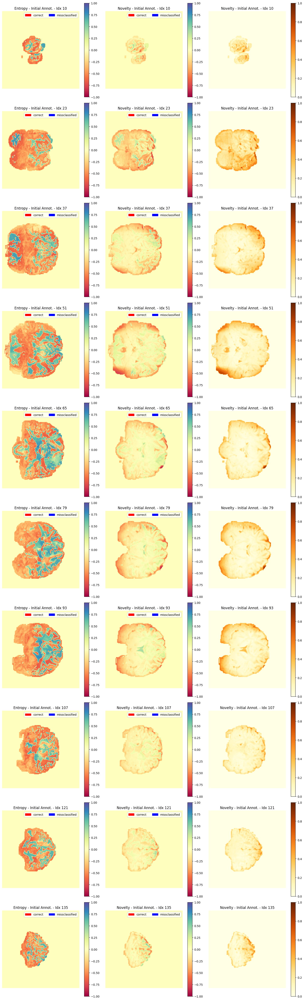

In [46]:
fig, axes = plot_slices(umap, nmap, errmap, num_slices=10, title1='Entropy - Initial Annot.', title2='Novelty - Initial Annot.')
plt.show()
fig.savefig('../../results/uncertainty-vs-novelty_fifth-refinement.png')

# errors are often FP for fornix

In [24]:
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.patches import Patch

def format_e(n):
    a = '%e' % n
    return a.split('e')[0].rstrip('0').rstrip('.') + 'e' + a.split('e')[1]


# Create a custom colormap - transparent for class 0, and different colors for other classes
seg_colors = ['none', 'yellow', 'green', 'blue']  # 'none' for transparent
err_colors = ['none', 'blue']
seg_cmap = ListedColormap(seg_colors)
err_cmap = ListedColormap(err_colors)

# Ensure the colormap is normalized to the number of classes
seg_norm = Normalize(vmin=0, vmax=len(seg_colors)-1)
err_norm = Normalize(vmin=0, vmax=len(err_colors)-1)

In [40]:
# modify plot function to include annotated voxels in third plot
# take annotation mask and 3D smooth, renormalize, and overlay on third plot

def plot_slices2(map_data1, map_data2, errmap, annot, num_slices=10, title1='Map1', title2='Map2'):
    slices = torch.linspace(10, map_data1.shape[0] - 10, num_slices).long()
    fig, axes = plt.subplots(num_slices, 3, figsize=(15, 5 * num_slices))

    vmax1 = 1 # map_data1.max().item()
    vmin1 = -vmax1
    vmax2 = 1 # map_data2.max().item()
    vmin2 = -vmax2


    legend_elements = [
        Patch(facecolor='red', edgecolor='red', label='correct'),
        Patch(facecolor='blue', edgecolor='blue', label='missclassified'),
    ]


    ## build annotation map
    pool = torch.nn.AvgPool3d(
        kernel_size=3,  # 9 to 3
        padding=1,
        stride=1
    )
    annot = annot.any(0, keepdim=True).float().unsqueeze(0)
    annot = pool(annot).squeeze()
    # annot = (annot - annot.min()) / (annot.max() - annot.min())
    annot = annot > 0
    annot = annot.squeeze()
    # rgba_overlay = np.zeros((*annot.shape, 4))
    # rgba_overlay[:, :, :, 2] = 1
    # # rgba_overlay[binary_overlay == 1, :3] = plt.colors.to_rgb(color)
    # rgba_overlay[:, :, :, 3] = annot
    # print(rgba_overlay.min(), rgba_overlay.max())

    for i, slice_idx in enumerate(slices):
        map_slice1 = map_data1[slice_idx].detach().cpu()
        map_slice2 = map_data2[slice_idx].detach().cpu()
        err_slice = errmap[slice_idx].detach().cpu()

        # Map1 where errmap is 1
        masked_map1_err1 = map_slice1.clone()
        masked_map1_err1[err_slice == 0] *= -1
        im1 = axes[i, 0].imshow(masked_map1_err1, vmin=vmin1, vmax=vmax1, cmap='Spectral')
        axes[i, 0].set_title(f'{title1} - Idx {slice_idx}')
        axes[i, 0].axis('off')
        axes[i, 0].legend(handles=legend_elements, loc='upper right', ncol=2)
        fig.colorbar(im1, ax=axes[i, 0])

        # Map2 where errmap is 1
        masked_map2_err1 = map_slice2.clone()
        masked_map2_err1[err_slice == 0] *= -1
        im2 = axes[i, 1].imshow(masked_map2_err1, vmin=vmin2, vmax=vmax2, cmap='Spectral')
        axes[i, 1].set_title(f'{title2} - Idx {slice_idx}')
        axes[i, 1].axis('off')
        axes[i, 1].legend(handles=legend_elements, loc='upper right', ncol=2)
        fig.colorbar(im2, ax=axes[i, 1])


        im3 = axes[i, 2].imshow(map_slice2, vmin=0, vmax=vmax2, cmap='YlOrBr')
        axes[i, 2].imshow(annot[i], cmap=err_cmap, norm=err_norm)
        axes[i, 2].set_title(f'{title2} - Idx {slice_idx}')
        axes[i, 2].axis('off')
        fig.colorbar(im3, ax=axes[i, 2])

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    return fig, axes

In [ ]:
dataset.user = UserModel(dataset.label, 'ground_truth', cfg)
dataset.init = 'per_class'
# currently, there are no annotations. We can also enforce this with clear_annotations() at any point
dataset.clear_annotation()
# get initial annotations
annot = dataset.initial_annotation(seed=42)
# and update the dataset
dataset.update_annotation(annot)
print(f"number of annotations: {dataset.annotations.detach().cpu().sum()}")
dataset.user = UserModel(dataset.label, 'estimated', cfg)

n_annots = dataset.user.refinement_annotation(
    prediction=prediction,
    #self.label.detach().cpu(),
    annotation_mask=dataset.annotations.detach().cpu(),
    uncertainty_map=uncertainty_maps['feature-distance'],
    n_samples=200,
    mode='per_class',
    seed=42,
    inverse_class_freq=False
)
dataset.update_annotation(n_annots)

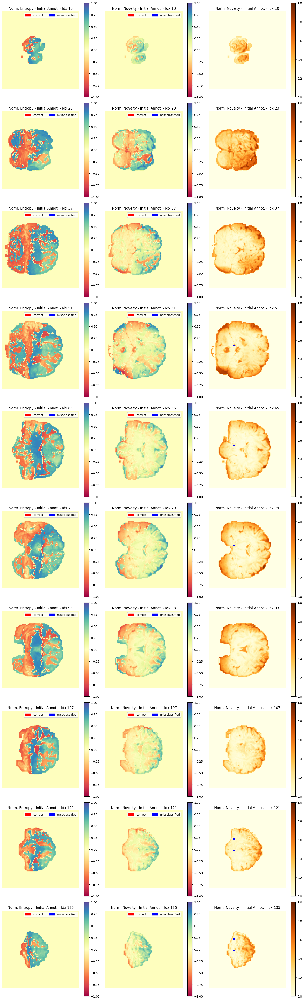

In [42]:
annot = dataset.annotations.clone()
fig, axes = plot_slices2(umap, nmap, errmap, annot=annot, num_slices=10, title1='Norm. Entropy - Initial Annot.', title2='Norm. Novelty - Initial Annot.')
plt.show()

torch.Size([143, 143, 143])

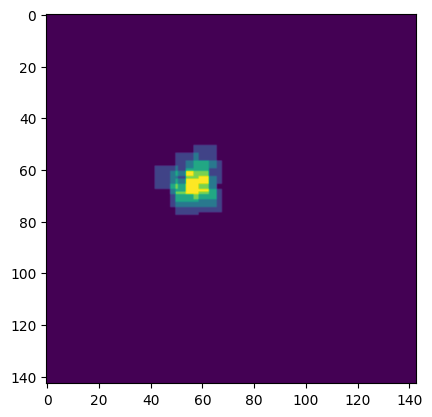

In [68]:
annot = dataset.annotations.clone()

## build annotation map
pool = torch.nn.AvgPool3d(
    kernel_size=9,
    padding=3,
    stride=1
)
annot = annot.sum(0, keepdim=True).float().unsqueeze(0)
annot = pool(annot).squeeze()
annot /= annot.max()
plt.imshow(annot[0])
annot.shape

(array([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0., 7284.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.]),
 array([0.5       , 0.50999999, 0.51999998, 0.52999997, 0.54000002,
        0.55000001, 0.56      , 0.56999999, 0.57999998, 0.58999997,
        0.60000002, 0.61000001, 0.62      , 0.63      , 0.63999999

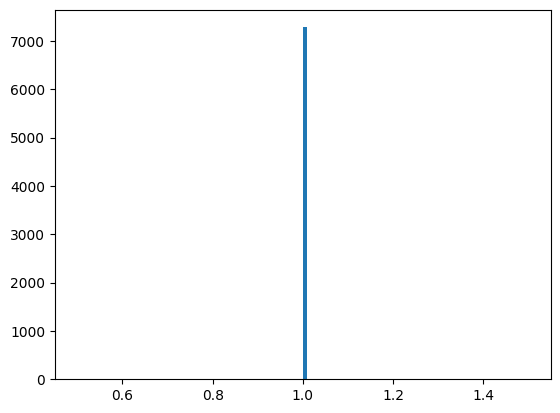

In [103]:
plt.hist(annot[annot>0].flatten().numpy(), bins=100)

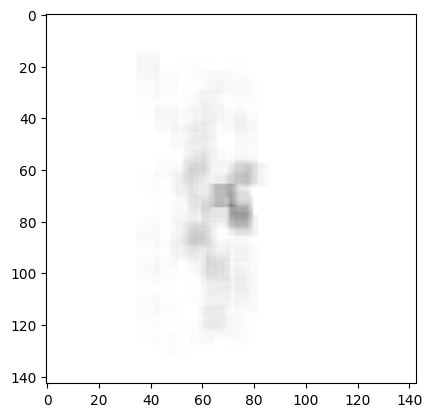

In [69]:
rgba_overlay = np.zeros((*annot.shape, 4))
# rgba_overlay[binary_overlay == 1, :3] = plt.colors.to_rgb(color)
rgba_overlay[:, :, :, 3] = annot
plt.imshow(rgba_overlay[65])

In [57]:
annot

tensor(0.0044)